#### STEPS
Python Project Template
1. Prepare Problem
a) Load libraries
b) Load dataset

2. Summarize Data
a) Descriptive statistics
b) Data visualizations

3. Prepare Data
a) Data Cleaning
b) Feature Selection
c) Data Transforms

4. Evaluate Algorithms
a) Split-out validation dataset
b) Test options and evaluation metric
c) Spot Check Algorithms
d) Compare Algorithms

5. Improve Accuracy
a) Algorithm Tuning
b) Ensembles

6. Finalize Model
a) Predictions on validation dataset
b) Create standalone model on entire training dataset
c) Save model for later use

In [55]:
# IMD Python Project Pipeline
# 1. Prepare Problem
# a) Load libraries
#import the necessary libraries
import pandas as pd # For the manipulation of tabular data
import numpy as np # For improved numerical calculation
from ydata_profiling import ProfileReport # For exploratory data analysis reporting
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For improved plot outlook

%matplotlib inline 
#Tells Jupyter to display any matplotlib plots directly within the notebook, rather than in a separate. Alt: plt.show()

# Importing the scaler
from sklearn.preprocessing import StandardScaler

# Importing required models and metrics
# Importing necessary modules for cross-validation
from sklearn.model_selection import StratifiedKFold, cross_val_score

# Importing classifiers based on their functionalities
# Dummy Classifier: A baseline classifier that predicts classes based on simple rules
from sklearn.dummy import DummyClassifier  
# Logistic Regression: A linear model for classification tasks, often used for binary classification
from sklearn.linear_model import LogisticRegression  
# Gaussian Naive Bayes: A probabilistic classifier based on Bayes' theorem with Gaussian distribution assumption
from sklearn.naive_bayes import GaussianNB  
# K-Nearest Neighbors: A non-parametric method used for classification based on nearest training examples
from sklearn.neighbors import KNeighborsClassifier  
# Decision Tree: A non-linear model that partitions the feature space into regions to make predictions
from sklearn.tree import DecisionTreeClassifier  
# Support Vector Classifier: A powerful classifier that finds the hyperplane that best separates classes in high-dimensional space
from sklearn.svm import SVC  

# Importing ensemble classifiers
# Random Forest: An ensemble method that builds multiple decision trees and combines their predictions
from sklearn.ensemble import RandomForestClassifier  
# Gradient Boosting Classifier: An ensemble method that builds trees sequentially, each correcting the mistakes of the previous one
from sklearn.ensemble import GradientBoostingClassifier  
# AdaBoost Classifier: An ensemble method that combines multiple weak learners to build a strong classifier
from sklearn.ensemble import AdaBoostClassifier  

# removing the warnings from the cells. 
# import warnings  # Importing the warnings module
# warnings.filterwarnings('ignore')  # Setting up a filter to ignore warnings. Good if you are confident with the codes

In [56]:
# b) Load dataset
IMD_Data = pd.read_stata("DATASET16MARCH2024.dta")
IMD_Data.head(5)

C:\Users\isaac\AppData\Local\Temp\ipykernel_20972\1656256738.py:2: UnicodeWarning: 
One or more strings in the dta file could not be decoded using utf-8, and
so the fallback encoding of latin-1 is being used.  This can happen when a file
has been incorrectly encoded by Stata or some other software. You should verify
the string values returned are correct.
  IMD_Data = pd.read_stata("DATASET16MARCH2024.dta")


,PatientID,age,agecatak,AgeCategory,sex1,religion1,childeduc1,heightst1,weightst1,height_m,...,stin2vntr_,httlpr1,HTTLPRrs35531,rs35531,Rs10482605,Rs1360780,rs1386494,rs1843809,rs34517220,_merge
0,CHAKA/01/01/0001,11.668720,9-12,Adolescent,Female,Born Again,Pre-primary,134.0,31.0,1.340,...,NaN,SS,NaN,NaN,A:A,C:T,A:A,G:G,A:A,matched (3)
1,CHAKA/01/01/0002,15.000000,13-17,Adolescent,Male,Protestant,Pre-primary,137.0,35.0,1.370,...,12/12,SS,SA/SA,A:A,A:A,C:T,A:A,G:G,A:A,matched (3)
2,CHAKA/01/01/0003,6.020534,9-12,Adolescent,Female,Muslim,Pre-primary,120.1,19.0,1.201,...,10/10,LL,LA/LG,A:G,G:A,C:T,G:A,T:G,A:A,matched (3)
3,CHAKA/01/02/0152,5.242984,5-8,Children,Female,Catholic,Pre-primary,99.0,15.0,0.990,...,12/12,LS,SA/LG,A:G,A:A,C:C,G:A,T:G,A:A,matched (3)
4,CHAKA/01/02/0153,11.696098,9-12,Adolescent,Female,Muslim,Pre-primary,131.6,30.0,1.316,...,12/12,LL,LA/LA,A:A,A:A,C:C,G:G,T:G,G:A,matched (3)


In [57]:
# List variable names
variable_names = IMD_Data.columns.tolist()

# Print the variable names
print(variable_names)

['PatientID', 'age', 'agecatak', 'AgeCategory', 'sex1', 'religion1', 'childeduc1', 'heightst1', 'weightst1', 'height_m', 'BMI', 'rounded_bmi', 'BMI_category', 'childtrib1', 'motherali1', 'fatherali1', 'orphanhood', 'ses', 'ses_cat', 'livelihood1', 'sexualever1', 'childstay1', 'childartk1', 'childworst1', 'childpremt1', 'chilborhiv', 'tobacco_status', 'alcohol1', 'Stress', 'GroupCategory', 'cd4takeoff1', 'CD4_category', 'Viralload', 'Viralload_Category', 'tlbase', 'ptsd', 'gad', 'mdd', 'pc', 'intdis', 'IMDs', 'stin2vntr_', 'httlpr1', 'HTTLPRrs35531', 'rs35531', 'Rs10482605', 'Rs1360780', 'rs1386494', 'rs1843809', 'rs34517220', '_merge']


In [58]:
#Dropping Non-Important and Redundant Variables 
# List of variables to drop

columns_to_drop = ['PatientID', 'age', 'height_m', 'BMI', 'rounded_bmi', 'motherali1', 'fatherali1', 'tobacco_status', 'alcohol1', 'ses', 'cd4takeoff1', 'Viralload', 'ptsd', 'gad', 'mdd', 'pc', 'intdis', '_merge' ]

# Dropping the specified columns
IMD_Dataset = IMD_Data.drop(columns=columns_to_drop)

In [59]:
# 2. Summarize Data
# a) Descriptive statistics
# b) Data visualizations

In [60]:
# 2. Summarize Data
# a) Descriptive statistics
IMD_Dataset.dtypes

agecatak                object
AgeCategory             object
sex1                  category
religion1             category
childeduc1            category
heightst1              float64
weightst1              float64
BMI_category          category
childtrib1            category
orphanhood            category
ses_cat               category
livelihood1           category
sexualever1           category
childstay1            category
childartk1            category
childworst1           category
childpremt1           category
chilborhiv            category
Stress                category
GroupCategory         category
CD4_category          category
Viralload_Category    category
tlbase                 float64
IMDs                  category
stin2vntr_            category
httlpr1               category
HTTLPRrs35531         category
rs35531               category
Rs10482605              object
Rs1360780               object
rs1386494               object
rs1843809               object
rs345172

In [61]:
IMD_Dataset.shape

(736, 33)

In [62]:
IMD_Dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
heightst1,733.0,131.050887,22.690718,12.500000,119.00000,130.600000,144.000000,427.200000
weightst1,736.0,29.878111,11.915348,10.000000,21.00000,27.000000,36.000000,153.000000
tlbase,613.0,1.147457,0.362307,0.019943,0.91413,1.133582,1.358633,2.179359


In [63]:
# Checking for missing values
IMD_Dataset.isnull().sum()

agecatak                0
AgeCategory             0
sex1                    1
religion1               1
childeduc1              3
heightst1               3
weightst1               0
BMI_category            3
childtrib1              1
orphanhood             18
ses_cat                 0
livelihood1             7
sexualever1           477
childstay1             11
childartk1              0
childworst1             0
childpremt1             2
chilborhiv              1
Stress                  0
GroupCategory           0
CD4_category            4
Viralload_Category    125
tlbase                123
IMDs                    0
stin2vntr_             78
httlpr1                38
HTTLPRrs35531          51
rs35531                51
Rs10482605              0
Rs1360780               0
rs1386494               0
rs1843809               0
rs34517220              0
dtype: int64

In [64]:
# Checking for duplicates
IMD_Dataset.duplicated().sum()


0

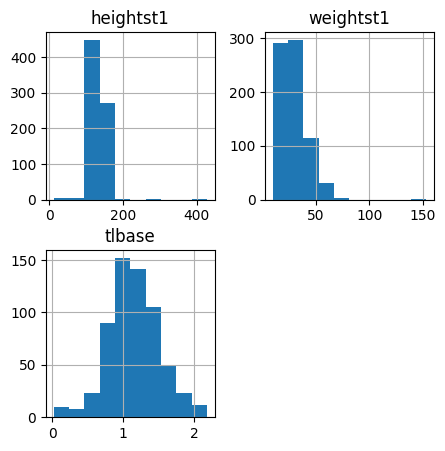

In [65]:
# b) Data visualizations
#Visualize the distribution of data in the dataset and identify any potential outliers or skewness in the data.
IMD_Dataset.hist(figsize=(5,5));

In [66]:
# 3. Prepare Data
# a) Data Cleaning
# b) Feature Selection
# c) Data Transforms



In [67]:
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns

# create a copy of the original dataset with a new name
IMD_Copy = IMD_Dataset.copy()

# create an EDA report using pandasprofiling
profile = IMD_Copy.profile_report()

#Saving the profile report
profile.to_file("IMD_Profile_Report.html")

# Display the profile report
display(profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\isaac\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'Function <code object pandas_auto_compute at 0x000001C0A6DC7260, file "c:\Users\isaac\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\model\pandas\correlations_pandas.py", line 164>')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

c:\Users\isaac\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\visualisation\utils.py:73: UserWarning: Glyph 146 (\x92) missing from current font.
  plt.savefig(
c:\Users\isaac\AppData\Local\Programs\Python\Python311\Lib\site-packages\ydata_profiling\visualisation\utils.py:73: UserWarning: Glyph 146 (\x92) missing from current font.
  plt.savefig(


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Observations from pandas profiling
- `General Statistics:` There were about 35 variables. with 736 observations. The missing cells composed of 3.9%. There were no duplicates.
- `Presence of categorical data:` There were 32 variables that were tagged as categorical data and this informed our decision to perfoim onehort-encoding on them as machine learning algorithms only work on non categorical data.
- `Presence of a variables that were in ranges greater than [0,1]:` There was a total of three variables with a range greater than [0,1] and this informed our decision to carry out minmax scaling during data transformation to normalise those variables. The vraibles included: height1, weight1, and tlbase. 
- `Presence of a highly imbalanced variable:` There were 9 variables childeduc1, BMI_category, livelihood1, sexualever1, childartk1, childpremt1, chilborhiv' that were imbalanced and this informed our decision to `drop` it during data transformation.


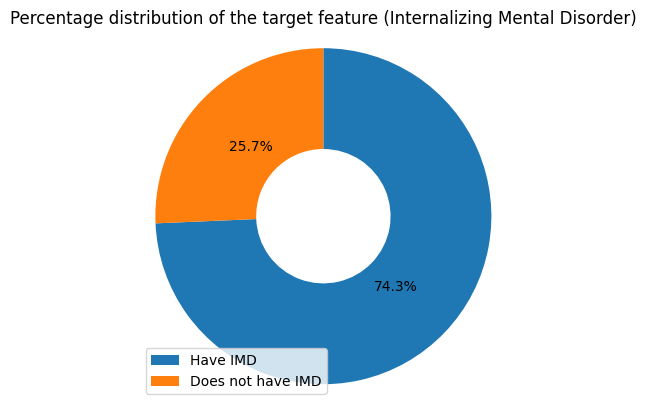

In [68]:
# Proportion of fetal health classes
plt.pie(IMD_Copy['IMDs'].value_counts(), startangle = 90, counterclock = False, autopct='%1.1f%%', wedgeprops = {'width' : 0.6});
plt.axis('square')
plt.legend(['Have IMD','Does not have IMD'])
plt.title("Percentage distribution of the target feature (Internalizing Mental Disorder)");

In [69]:
# # replace the 0 values with the mean of non-zero values in the BloodPressure column
# mean_bp = cleaned_data[cleaned_data['BloodPressure'] != 0]['BloodPressure'].mean()
# print(mean_bp)
# cleaned_data['BloodPressure'] = cleaned_data['BloodPressure'].replace(0, mean_bp)

# # clean the data by removing any duplicates and handling missing values
# cleaned_data.drop_duplicates(inplace=True)
# cleaned_data.dropna(inplace=True)

# # save the cleaned dataset and the EDA report as a PDF file
# cleaned_data.to_csv('cleaned_data.csv', index=False)
# profile.to_file(output_file='eda_report.pdf')

# # create a histogram of the BloodPressure values
# sns.histplot(data=cleaned_data, x='BloodPressure', kde=True)


In [70]:
# # Correlation between the features
# plt.figure(figsize = [15, 15])
# sns.heatmap(IMD_Copy.corr(method = 'pearson'), annot = True, fmt = '.3f', cmap = 'vlag_r', center = 0)
# plt.title("Correlation between each pair of features in the  IMD data", fontsize = 20);

MISSING VALUE IMPUTATIONS

In [71]:
# Missing Values before Imputations
IMD_Copy.isnull().sum()

agecatak                0
AgeCategory             0
sex1                    1
religion1               1
childeduc1              3
heightst1               3
weightst1               0
BMI_category            3
childtrib1              1
orphanhood             18
ses_cat                 0
livelihood1             7
sexualever1           477
childstay1             11
childartk1              0
childworst1             0
childpremt1             2
chilborhiv              1
Stress                  0
GroupCategory           0
CD4_category            4
Viralload_Category    125
tlbase                123
IMDs                    0
stin2vntr_             78
httlpr1                38
HTTLPRrs35531          51
rs35531                51
Rs10482605              0
Rs1360780               0
rs1386494               0
rs1843809               0
rs34517220              0
dtype: int64

In [72]:
# Import pandas
import pandas as pd
# Impute missing values in numerical variables with mean
numerical_columns = IMD_Copy.select_dtypes(include=['float64', 'int64']).columns
IMD_Copy[numerical_columns]= IMD_Copy[numerical_columns].fillna(IMD_Copy[numerical_columns].mean())

# Impute missing values in categorical variables with mode
categorical_columns = IMD_Copy.select_dtypes(include=['object', 'category']).columns
IMD_Copy[categorical_columns] = IMD_Copy[categorical_columns].fillna(IMD_Copy[categorical_columns].mode().iloc[0])

# Check if all missing values are imputed
print("Missing Values after Imputation:")
print(IMD_Copy.isnull().sum())

Missing Values after Imputation:
agecatak              0
AgeCategory           0
sex1                  0
religion1             0
childeduc1            0
heightst1             0
weightst1             0
BMI_category          0
childtrib1            0
orphanhood            0
ses_cat               0
livelihood1           0
sexualever1           0
childstay1            0
childartk1            0
childworst1           0
childpremt1           0
chilborhiv            0
Stress                0
GroupCategory         0
CD4_category          0
Viralload_Category    0
tlbase                0
IMDs                  0
stin2vntr_            0
httlpr1               0
HTTLPRrs35531         0
rs35531               0
Rs10482605            0
Rs1360780             0
rs1386494             0
rs1843809             0
rs34517220            0
dtype: int64


In [73]:
from sklearn.preprocessing import OneHotEncoder


### Scaling
Ploting the data before rescaling

<Axes: >

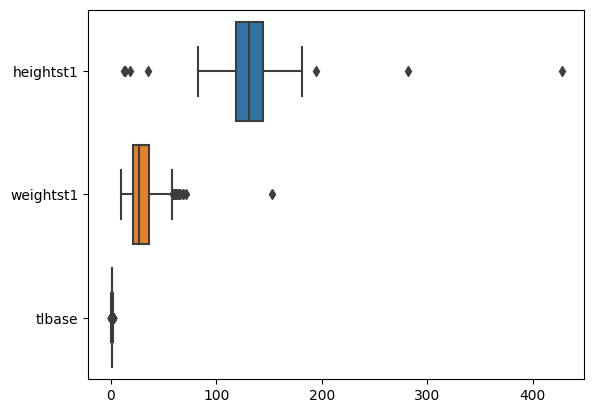

In [74]:
sns.boxplot(IMD_Copy, orient = 'h')

<Axes: >

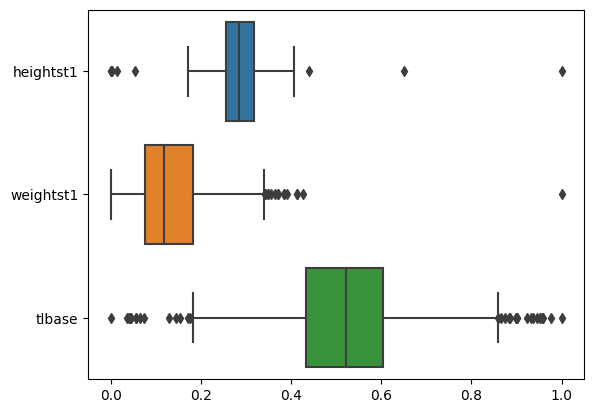

In [75]:
# MinMax Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
IMD_Copy[['heightst1', 'weightst1','tlbase']] = scaler.fit_transform(IMD_Copy[['heightst1', 'weightst1','tlbase']])
#print(IMD_Copy.head(5))
sns.boxplot(IMD_Copy, orient = 'h')

In [76]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Since IMD_Copy contains both features and the target variable
# Separate features and target variable
features = IMD_Copy.drop('IMDs', axis=1)
target = IMD_Copy['IMDs']

In [86]:
# Label encode the features variable if it's categorical
# Label encode the features variable if it's categorical
for column in features.columns:
    if features[column].dtype == 'object' or features[column].dtype.name == 'category':
        label_encoder = LabelEncoder()
        features[column] = label_encoder.fit_transform(features[column])
features.head(5)

,agecatak,AgeCategory,sex1,religion1,childeduc1,heightst1,weightst1,BMI_category,childtrib1,orphanhood,...,tlbase,stin2vntr_,httlpr1,HTTLPRrs35531,rs35531,Rs10482605,Rs1360780,rs1386494,rs1843809,rs34517220
0,2,0,0,0,1,0.292983,0.146853,3,1,2,...,0.493433,2,2,0,0,2,3,2,2,2
1,0,0,1,4,1,0.300217,0.174825,0,1,2,...,0.549427,2,2,6,0,2,3,2,2,2
2,2,0,0,2,1,0.259465,0.062937,3,0,0,...,0.570102,0,0,1,1,3,3,3,3,2
3,1,1,0,1,1,0.208585,0.034965,3,1,0,...,0.770106,2,1,5,1,2,2,3,3,2
4,2,0,0,2,1,0.287196,0.139860,3,0,0,...,0.514873,2,0,0,0,2,2,4,3,3


In [ ]:
# # Print the label encodings
# for column in features.columns:
#     if features[column].dtype == 'int64':  # Assuming label encoding results in integer values
#         print(f"Column: {column}")
#         unique_values = features[column].unique()
#         for value in unique_values:
#             encoded_value = features[column][features[column] == value].iloc[0]
#             print(f"   {value} --> {encoded_value}")

In [88]:
# create an EDA report using pandasprofiling
profile2 = features.profile_report()

#Saving the profile report
profile2.to_file("Profile after Transformations and imputataions.html")

# Display the profile report
display(profile2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# 4. Evaluate Algorithms
# a) Split-out validation dataset
# b) Test options and evaluation metric
# c) Spot Check Algorithms
# d) Compare Algorithms



**Model Spot-checking**

The following classifiers have been used in the model spot-checking
- Dummy Classifier - Included to check for accuracy given only most frequent class is always predicted as target. Taken as lower baseline classifier.
- Logistic Regression
- Naive Bayes
- K-Nearest Neighbours
- Support Vector Machines - Support Vector Classifier
- Decision Trees
- Ensemble classifiers (Random Forests, Gradient Boosting Classifier and AdaBoostClassifier)

The chosen evaluation metric was `f1-score`. However, other metrics `precision`, `recall`, `roc_auc` were also employed to do model spot checking.

The **`_weighted`** versions of the metrics have been used to cater for `target imbalances` in the data. For `roc_auc`, the **`_ovo` (one versus one (ovo))** was used to cater for `imbalances` in the data too. The ovo is insensitive to data label imbalances unlike the `one versus rest` version.

The `StratifiedKFold` was used in `cross validation` to ensure each `split` contains equivalent proportions of the different `classes` in the data.

The `DummyClassifier` was used to set a `baseline score` given one choses the target value at random or selects the most frequent class.

In [91]:
# from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Instantiating the models
# dc = DummyClassifier(strategy='most_frequent')
lr = LogisticRegression()
nb = GaussianNB()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
sv = SVC(probability=True)  # Probability set to True to return a non-NaN roc_auc
rf = RandomForestClassifier()
gb = GradientBoostingClassifier()
ad = AdaBoostClassifier()
lda = LinearDiscriminantAnalysis()

from sklearn.model_selection import StratifiedKFold

# Setting the StratifiedKFold parameter
skfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
# ^ This creates a StratifiedKFold object with 10 splits, ensuring that each fold has approximately the same class distribution as the original dataset.
#   `random_state=42` ensures reproducibility of results, while `shuffle=True` shuffles the data before splitting into folds.

In [126]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
import warnings
# Suppress warnings
warnings.filterwarnings("ignore")

# Define models and scores as you did
models = [lr, nb, knn, dt, sv, rf, gb, ad, lda]
scores = ["f1_weighted", "precision_weighted", "recall_weighted", "accuracy", "roc_auc_ovo_weighted"]

# Initialize lists to store scores for each model
f1 = []
precision = []
recall = []
accuracy = []
roc_auc = []
score_lists = [f1, precision, recall, accuracy, roc_auc]

# Define the number of folds for cross-validation
n_splits = 10  # You can adjust this number as needed

# Split the data into training and testing sets
# Assuming features and target are already defined
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Initialize StratifiedKFold for cross-validation
skfold = StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)

# For loop to evaluate the models
for model in models:
    print(model)
    for index, score in enumerate(scores):
        cv_scores = cross_val_score(model, X_train, y_train, cv=skfold, scoring=score)
        score_lists[index].append(np.mean(cv_scores))
        print(score + " : " + str(np.mean(cv_scores)))
    print("\n")


LogisticRegression()
f1_weighted : 0.7095916289180345
precision_weighted : 0.7086669184034733
recall_weighted : 0.7365575686732904
accuracy : 0.7365575686732904
roc_auc_ovo_weighted : 0.7021197723275356


GaussianNB()
f1_weighted : 0.31865032142756594
precision_weighted : 0.7041777990658643
recall_weighted : 0.37407948568088834
accuracy : 0.37407948568088834
roc_auc_ovo_weighted : 0.6650808579245652


KNeighborsClassifier()
f1_weighted : 0.6646612159897186
precision_weighted : 0.6589451704519468
recall_weighted : 0.683635300993571
accuracy : 0.683635300993571
roc_auc_ovo_weighted : 0.6178862533385446


DecisionTreeClassifier()
f1_weighted : 0.6502804521240566
precision_weighted : 0.6470140216100926
recall_weighted : 0.6395675043834015
accuracy : 0.6275277615429573
roc_auc_ovo_weighted : 0.5558163963259722


SVC(probability=True)
f1_weighted : 0.604269376007632
precision_weighted : 0.5200432037891444
recall_weighted : 0.7210987726475746
accuracy : 0.7210987726475746
roc_auc_ovo_weighted

In [106]:
import warnings
# Suppress warnings
warnings.filterwarnings("ignore")

models = [lr, nb, knn, dt, sv, rf, gb, ad, lda] # holds the models to be spot-checked.
scores = ["f1_weighted", "precision_weighted", "recall_weighted", "accuracy", "roc_auc_ovo_weighted"]
f1 = [] # To hold the f1-scores for each model
precision = [] # To hold the precision scores for each model
recall = [] # To hold the recall scores for each model
accuracy = [] # To hold the accuracy scores for each model
roc_auc = [] # To hold the roc_auc scores for each model
score_lists = [f1, precision, recall, accuracy, roc_auc]

# For loop to evaluate the models
for model in models:
    print(model)
    for index,score in enumerate(scores):
        cv_score = cross_val_score(model, features, target, cv=skfold, scoring = score)
        score_lists[index].append(cv_score)
        print(score + " : "+ str(np.mean(cv_score)))
        
    print("\n")

DummyClassifier(strategy='most_frequent')
f1_weighted : 0.6337289226241328
precision_weighted : 0.5523695613167803
recall_weighted : 0.7432062199185487
accuracy : 0.7432062199185487
roc_auc_ovo_weighted : 0.5


LogisticRegression()
f1_weighted : 0.7024463294907293
precision_weighted : 0.6996059511598117
recall_weighted : 0.7403924472417622
accuracy : 0.7403924472417622
roc_auc_ovo_weighted : 0.6992681197944356


GaussianNB()
f1_weighted : 0.3038794226918855
precision_weighted : 0.712282122118845
recall_weighted : 0.3547019622362088
accuracy : 0.3547019622362088
roc_auc_ovo_weighted : 0.6512581959950382


KNeighborsClassifier()
f1_weighted : 0.6928146387765832
precision_weighted : 0.6827023957394662
recall_weighted : 0.7161051462421326
accuracy : 0.7161051462421326
roc_auc_ovo_weighted : 0.6202799929115719


DecisionTreeClassifier()
f1_weighted : 0.6699442585383135
precision_weighted : 0.6581481193845043
recall_weighted : 0.6589411329137358
accuracy : 0.6630136986301369
roc_auc_ovo_weig

In [93]:
# Adding all scores to the same dataframe for proper plotting
models_names = ['DC','LR', 'NB', 'KNN', 'DT', 'SV', 'RF', 'GB', 'AD', 'LDA']

df_f1 = pd.DataFrame(f1, columns = list(range(10)), index = models_names).T.assign(Score = 'f1')
df_precision = pd.DataFrame(precision, columns = list(range(10)), index = models_names).T.assign(Score = 'precision')
df_recall = pd.DataFrame(recall, columns = list(range(10)), index = models_names).T.assign(Score = 'recall')
df_accuracy = pd.DataFrame(accuracy, columns = list(range(10)), index = models_names).T.assign(Score = 'accuracy')
df_roc = pd.DataFrame(roc_auc, columns = list(range(10)), index = models_names).T.assign(Score = 'roc_auc')

concated_df = pd.concat([df_f1, df_precision, df_recall, df_accuracy, df_roc])                            
melted_df = pd.melt(concated_df, id_vars=['Score'], var_name=['Model']) 
# Making a box plot for all metrics and models
plt.figure(figsize=(10,6))
sns.boxplot(x="Model", y="value", hue="Score", data=melted_df) 
plt.title("Evaluation Metrics Scores by Model", fontsize = 12)

Text(0.5, 1.0, 'Evaluation Metrics Scores by Model')

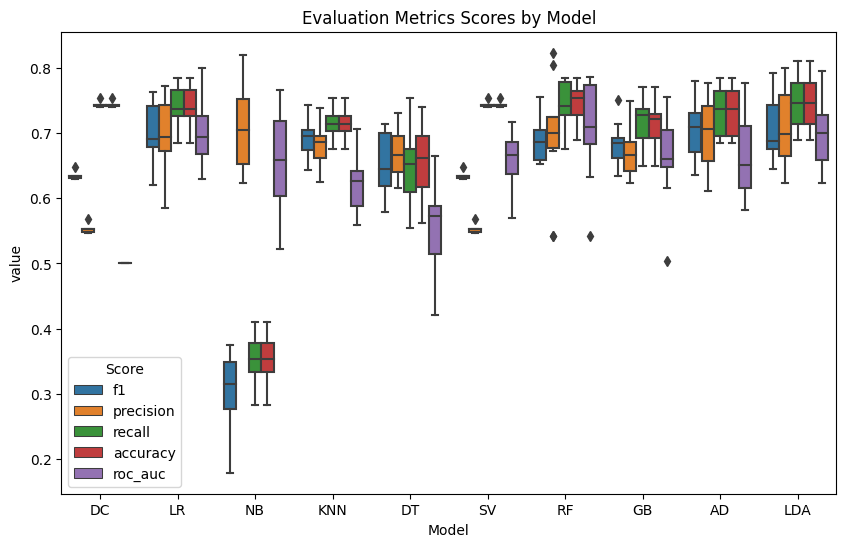

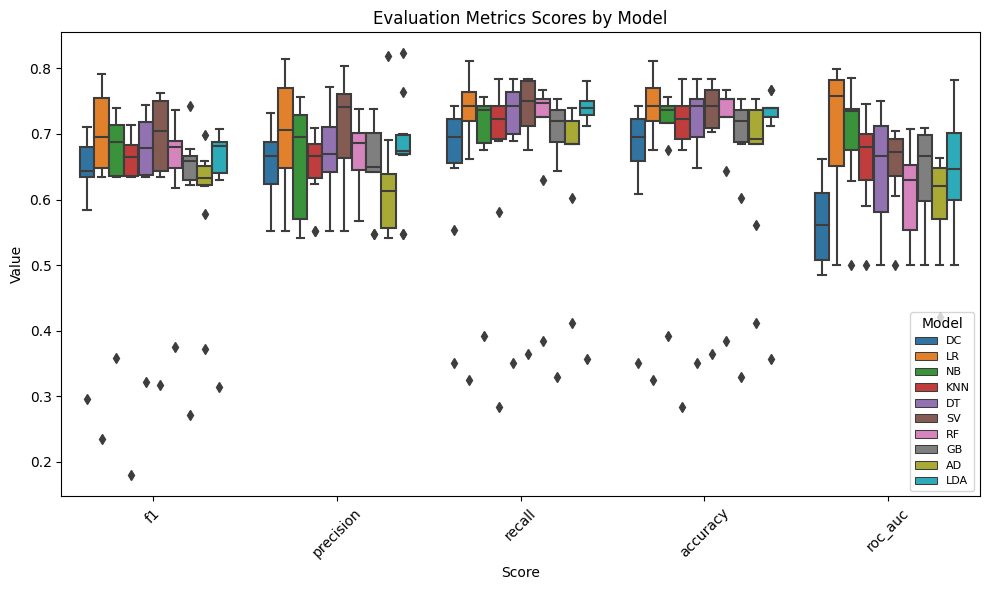

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define model names
models_names = ['DC', 'LR', 'NB', 'KNN', 'DT', 'SV', 'RF', 'GB', 'AD', 'LDA']

# Create dataframes for each metric
df_f1 = pd.DataFrame(f1, columns=models_names, index=range(10)).assign(Score='f1').melt(id_vars=['Score'], var_name='Model')
df_precision = pd.DataFrame(precision, columns=models_names, index=range(10)).assign(Score='precision').melt(id_vars=['Score'], var_name='Model')
df_recall = pd.DataFrame(recall, columns=models_names, index=range(10)).assign(Score='recall').melt(id_vars=['Score'], var_name='Model')
df_accuracy = pd.DataFrame(accuracy, columns=models_names, index=range(10)).assign(Score='accuracy').melt(id_vars=['Score'], var_name='Model')
df_roc = pd.DataFrame(roc_auc, columns=models_names, index=range(10)).assign(Score='roc_auc').melt(id_vars=['Score'], var_name='Model')

# Concatenate all dataframes
concatenated_df = pd.concat([df_f1, df_precision, df_recall, df_accuracy, df_roc])

# Making a box plot for all metrics and models
plt.figure(figsize=(10, 6))
sns.boxplot(x="Score", y="value", hue="Model", data=concatenated_df)
plt.title("Evaluation Metrics Scores by Model", fontsize=12)
plt.xlabel("Score", fontsize=10)
plt.ylabel("Value", fontsize=10)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title="Model", fontsize=8)
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


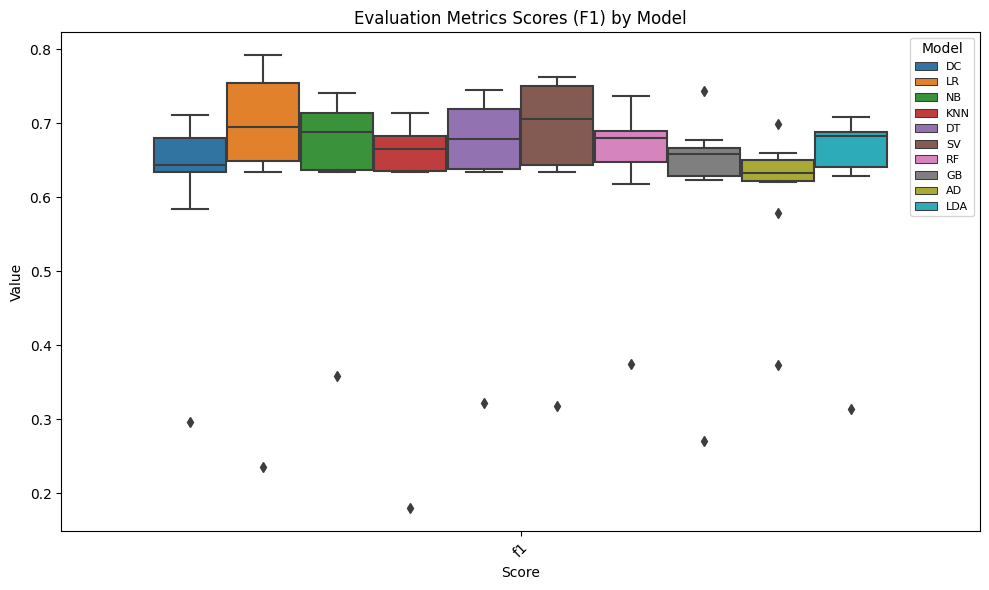

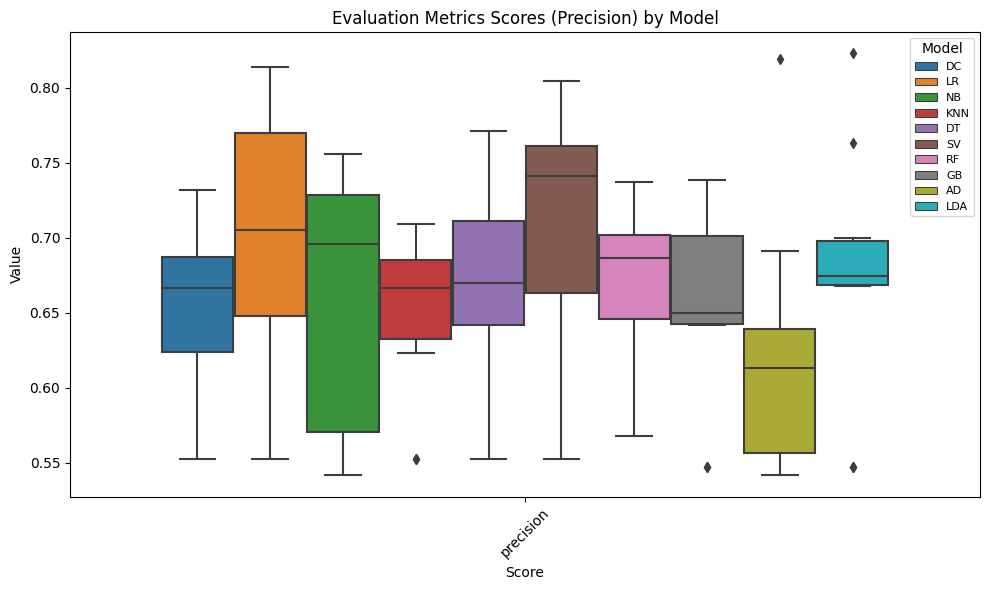

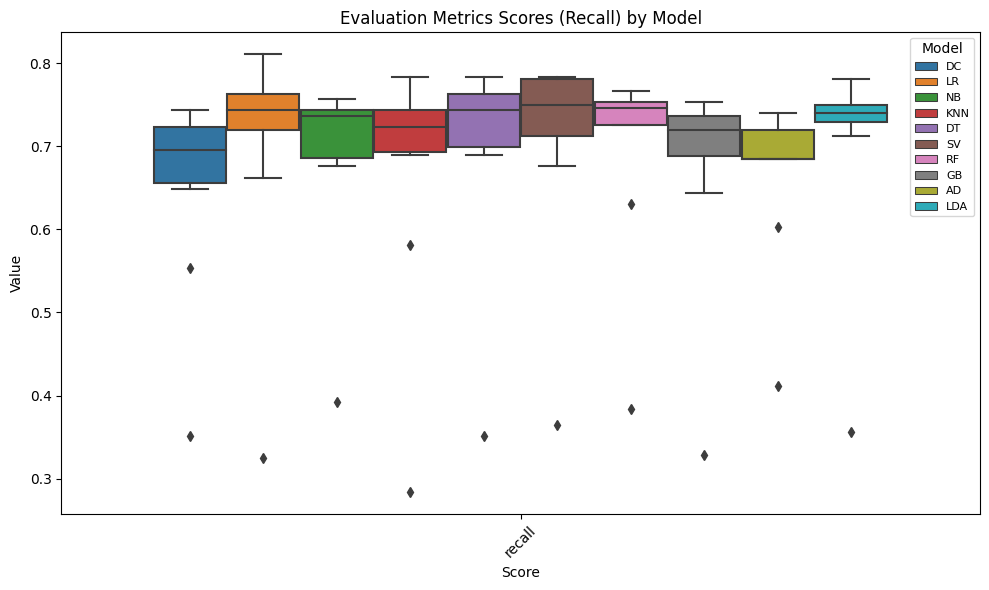

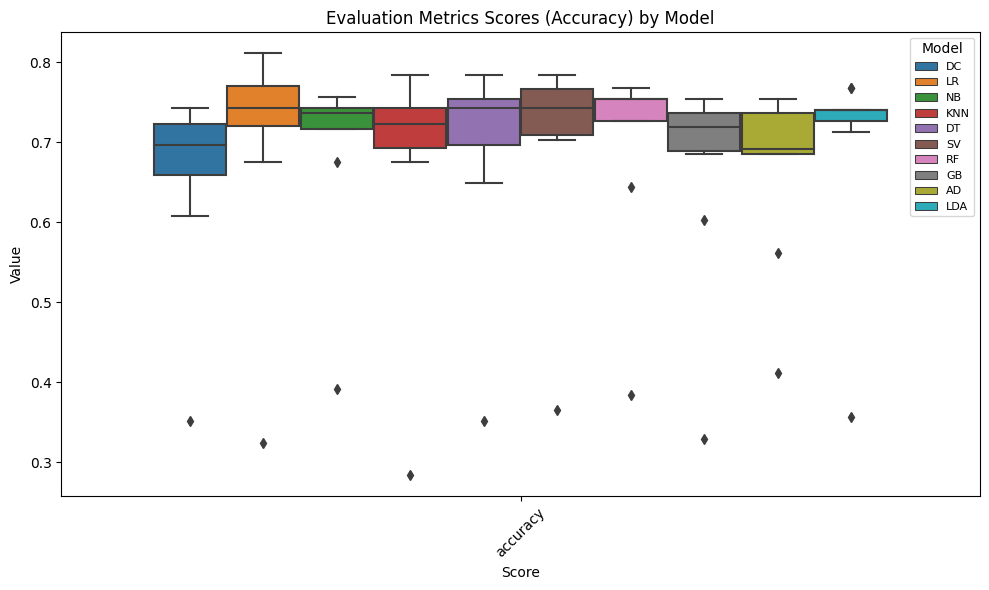

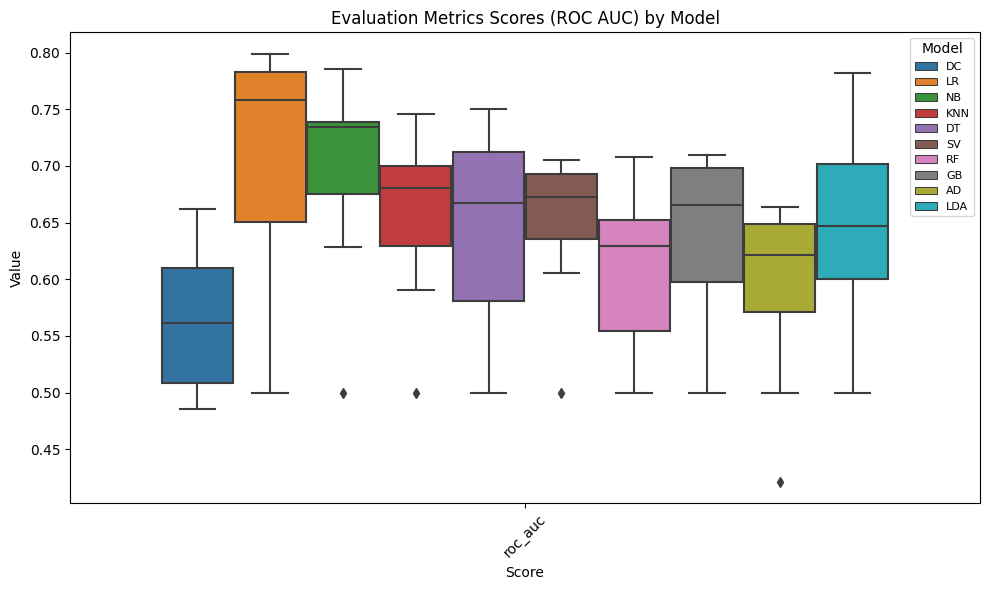

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define model names
models_names = ['LR', 'NB', 'KNN', 'DT', 'SV', 'RF', 'GB', 'AD', 'LDA']

# Create dataframes for each metric
df_f1 = pd.DataFrame(f1, columns=models_names, index=range(10)).assign(Score='f1').melt(id_vars=['Score'], var_name='Model')
df_precision = pd.DataFrame(precision, columns=models_names, index=range(10)).assign(Score='precision').melt(id_vars=['Score'], var_name='Model')
df_recall = pd.DataFrame(recall, columns=models_names, index=range(10)).assign(Score='recall').melt(id_vars=['Score'], var_name='Model')
df_accuracy = pd.DataFrame(accuracy, columns=models_names, index=range(10)).assign(Score='accuracy').melt(id_vars=['Score'], var_name='Model')
df_roc = pd.DataFrame(roc_auc, columns=models_names, index=range(10)).assign(Score='roc_auc').melt(id_vars=['Score'], var_name='Model')

# Create a dictionary to store dataframes
dataframes = {'F1': df_f1, 'Precision': df_precision, 'Recall': df_recall, 'Accuracy': df_accuracy, 'ROC AUC': df_roc}

# Create a separate plot for each score
for score, df in dataframes.items():
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Score", y="value", hue="Model", data=df)
    plt.title(f"Evaluation Metrics Scores ({score}) by Model", fontsize=12)
    plt.xlabel("Score", fontsize=10)
    plt.ylabel("Value", fontsize=10)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title="Model", fontsize=8)
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()


### Improving Accuracy

#### Hyperparameter tuning
Hyperparameter tuning is used to optimize the performance of machine learning models by searching for the best set of hyperparameters. Hyperparameters are settings that are not learned from the data but are set prior to training, such as the regularization strength in logistic regression, the depth of a decision tree, or the number of trees in a random forest.

Hyperparameter tuning is typically performed after selecting a model and before evaluating its performance on unseen data (e.g., a holdout test set). Here's a breakdown of the typical workflow involving hyperparameter tuning:

In [107]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Define the grid of hyperparameters for each model
# param_grid_dc = {}  # DummyClassifier does not have hyperparameters
param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
param_grid_nb = {}  # GaussianNB does not have hyperparameters
param_grid_knn = {'n_neighbors': [3, 5, 7, 9]}
param_grid_dt = {'max_depth': [None, 5, 10, 20]}
param_grid_sv = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}
param_grid_rf = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
param_grid_gb = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_ad = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_lda = {}  # LinearDiscriminantAnalysis does not have hyperparameters

# Define models to tune
models_to_tune = {'Logistic Regression': (lr, param_grid_lr),
                  'Gaussian Naive Bayes': (nb, param_grid_nb),
                  'K-Nearest Neighbors': (knn, param_grid_knn),
                  'Decision Tree': (dt, param_grid_dt),
                  'Support Vector Classifier': (sv, param_grid_sv),
                  'Random Forest': (rf, param_grid_rf),
                  'Gradient Boosting': (gb, param_grid_gb),
                  'AdaBoost': (ad, param_grid_ad),
                  'Linear Discriminant Analysis': (lda, param_grid_lda)}

# Perform grid search for each model
best_models = {}
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Validate performance on the test set
results = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    classification_rep = classification_report(y_test, y_pred)
    results[name] = classification_rep

# Print classification reports for each model on the test set
for name, report in results.items():
    print(f"Classification Report for {name}:\n{report}")

# Final Model Selection based on validation results
best_model_name = max(results, key=lambda key: results[key])
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

# You can now use 'best_model' for making predictions on new data


Classification Report for Dummy Classifier:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

          No       0.28      0.20      0.23        25
         Yes       0.85      0.89      0.87       123

    accuracy                           0.78       148
   macro avg       0.56      0.55      0.55       148
weighted avg       0.75      0.78      0.76       148

Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

          No       0.19      0.92      0.31        25
         Yes       0.92      0.20      0.32       123

    accuracy                           0.32

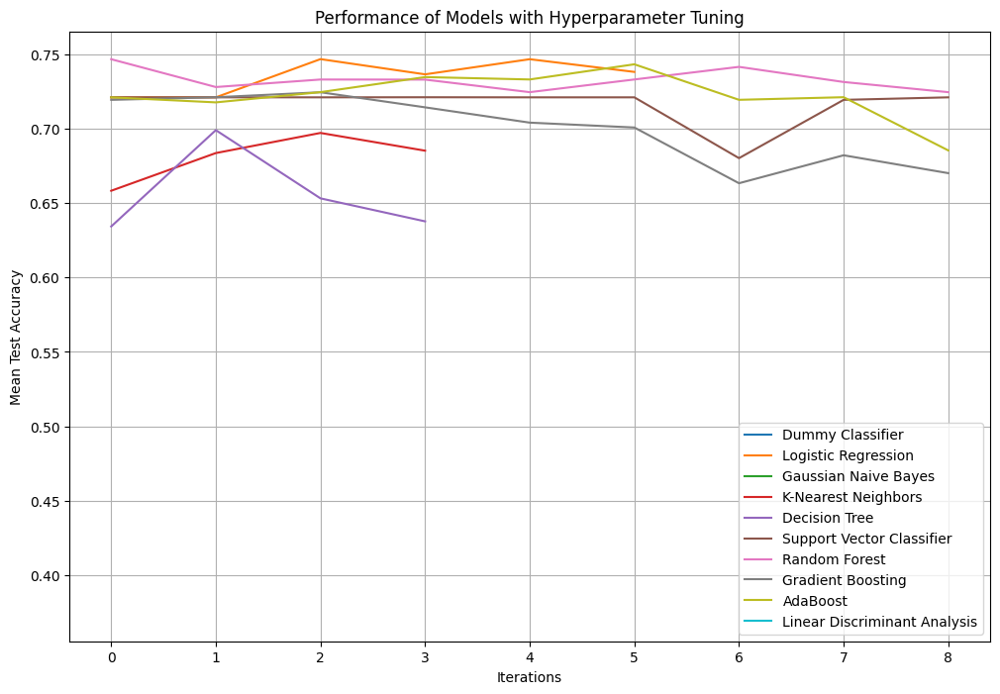

In [108]:
import matplotlib.pyplot as plt

# Plot the performance of each model
plt.figure(figsize=(12, 8))
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    mean_scores = grid_search.cv_results_['mean_test_score']
    plt.plot(mean_scores, label=name)

plt.title('Performance of Models with Hyperparameter Tuning')
plt.xlabel('Iterations')
plt.ylabel('Mean Test Accuracy')
plt.legend()
plt.grid(True)
plt.show()


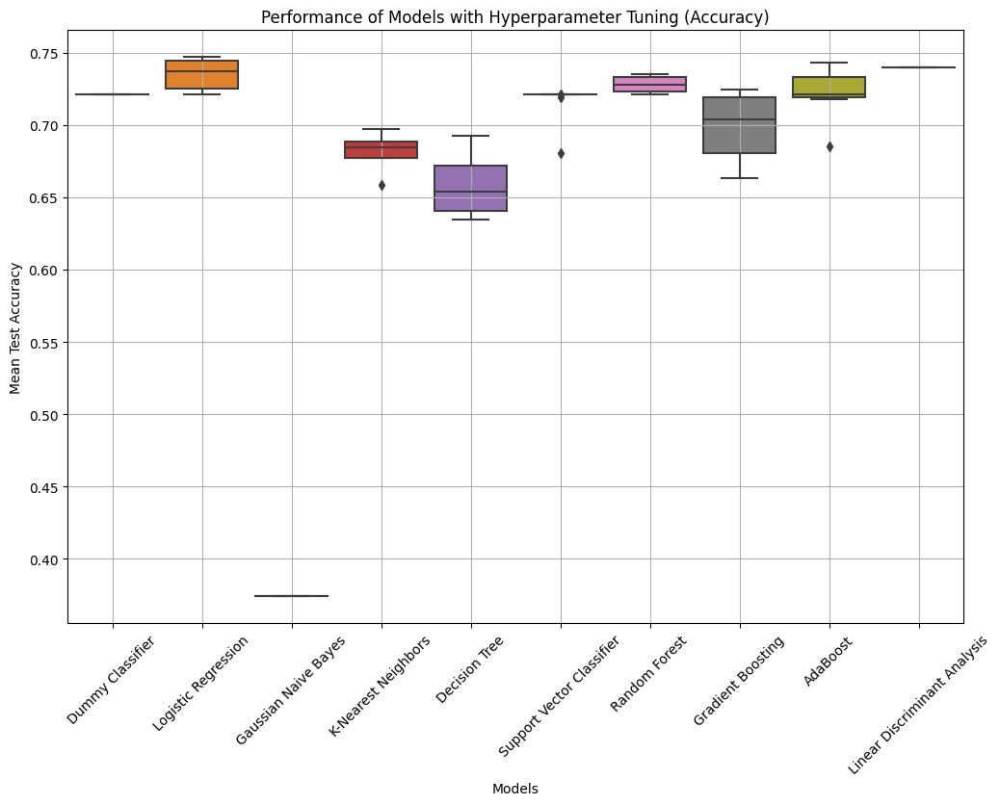

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

# List to store mean test accuracy for each model
mean_test_accuracy = []

# Loop through each model and perform grid search with cross-validation
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    mean_test_accuracy.append(grid_search.cv_results_['mean_test_score'])

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=mean_test_accuracy)
plt.title('Performance of Models with Hyperparameter Tuning (Accuracy)')
plt.xlabel('Models')
plt.ylabel('Mean Test Accuracy')
plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
plt.grid(True)
plt.show()


## When F1 is used to chosse the best Modle after hyper parameter tuning

In [114]:
# Perform grid search for each model
best_models = {}
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Validate performance on the test set
results = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    classification_rep = classification_report(y_test, y_pred)
    results[name] = classification_rep

# Print classification reports for each model on the test set
for name, report in results.items():
    print(f"Classification Report for {name}:\n{report}")

# Final Model Selection based on validation results
best_model_name = max(results, key=lambda key: results[key])
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

Classification Report for Dummy Classifier:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

          No       0.19      0.92      0.31        25
         Yes       0.92      0.20      0.32       123

    accuracy                           0.32

In [ ]:
# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=mean_f1_score)
plt.title('Performance of Models with Hyperparameter Tuning (f1 score)')
plt.xlabel('Models')
plt.ylabel('Mean Test Accuracy')
plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
plt.grid(True)
plt.show()

In [120]:
import re

# Define a function to extract accuracy from the classification report string
def extract_accuracy(classification_report):
    accuracy_match = re.search(r'accuracy\s*([\d.]+)', classification_report)
    if accuracy_match:
        return float(accuracy_match.group(1))
    else:
        return 0.0  # Return 0.0 if accuracy is not found

# Sort models based on performance (accuracy)
sorted_models = sorted(results.items(), key=lambda x: extract_accuracy(x[1]), reverse=True)

# Print sorted models
print("Sorted Models:")
for name, report in sorted_models:
    print(f"{name}:")
    print(report)


Sorted Models:
Dummy Classifier:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Logistic Regression:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Support Vector Classifier:
              precision    recall  f1-score   support

          No       0.00      0.00      0.00        25
         Yes       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45    

In [116]:
# Perform grid search for each model
best_models = {}
model_scores = {}

for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_
    model_scores[name] = grid_search.best_score_
    
# Sort models based on their scores (from best to worst)
sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted list of models with their scores
for name, score in sorted_models:
    print(f"{name}: {score}")

# Select the best model
best_model_name = sorted_models[0][0]
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

Dummy Classifier: nan
Logistic Regression: nan
Gaussian Naive Bayes: nan
K-Nearest Neighbors: nan
Decision Tree: nan
Support Vector Classifier: nan
Random Forest: nan
Gradient Boosting: nan
AdaBoost: nan
Linear Discriminant Analysis: nan

Best Model Selected: Dummy Classifier


Alternative method to Improvinf Perfromac eis Ensemble methods 
Ensemble methods are techniques that combine multiple individual models to improve the overall predictive performance compared to any single model. They work by leveraging the wisdom of the crowd, where the collective decision of multiple models tends to be more accurate and robust than the decision of any individual model. Some popular ensemble methods for improving accuracy include:

Bagging (Bootstrap Aggregating):

Random Forest: Constructs multiple decision trees during training and outputs the mode of the classes as the prediction (classification) or average prediction (regression) of the individual trees.
Bagged Decision Trees: Similar to Random Forest but typically with decision trees as base learners.
Boosting:

AdaBoost (Adaptive Boosting): Iteratively trains weak classifiers (e.g., shallow decision trees) on different subsets of the training data, giving more weight to misclassified samples in subsequent iterations.
Gradient Boosting Machines (GBM): Builds an ensemble of trees sequentially, where each new tree corrects the errors made by the previous ones by fitting residuals.
Stacking (Stacked Generalization):

Stacked Ensemble: Combines the predictions of multiple models (base learners) using a meta-model (often logistic regression or another model) that learns how to best combine the predictions.
Voting:

Voting Classifier: Combines the predictions of multiple base classifiers (e.g., decision trees, SVMs, logistic regression) and predicts the class with the most votes (hard voting) or the class with the highest average probability (soft voting).
Bayesian Model Averaging (BMA):

Bayesian Voting: Instead of using equal weights for all models, assigns different weights to models based on their performance on validation data.

In [ ]:
# 6. Finalize Model
# a) Predictions on validation dataset
# b) Create standalone model on entire training dataset
# c) Save model for later use

In [135]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

# Split the training data into training and validation sets
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Make predictions on the validation dataset
y_pred_validation = best_model.predict(X_validation)

# Calculate evaluation metrics
accuracy = accuracy_score(y_validation, y_pred_validation)
precision = precision_score(y_validation, y_pred_validation, average='weighted')
recall = recall_score(y_validation, y_pred_validation, average='weighted')
f1 = f1_score(y_validation, y_pred_validation, average='weighted')

# Print evaluation metrics
print(f"Accuracy on validation dataset: {accuracy}")
print(f"Precision on validation dataset: {precision}")
print(f"Recall on validation dataset: {recall}")
print(f"F1-score on validation dataset: {f1}")


Accuracy on validation dataset: 0.7692307692307693
Precision on validation dataset: 0.591715976331361
Recall on validation dataset: 0.7692307692307693
F1-score on validation dataset: 0.6688963210702341


### FEATURE IMPORTANCE 


Feature importance is a technique used to understand which features have the most impact on a model's predictions. It helps in feature selection, model interpretation, identifying data quality issues, and gaining business insights.

In [139]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importances(model, features):
    """
    Plot feature importances for the given model.
    
    Parameters:
        model (object): The trained model for which feature importances are to be plotted.
        features (DataFrame): DataFrame containing the features used for training.
    """
    # Check if the model supports feature importances
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        feature_importances = model.feature_importances_
        
        # Assuming your features are stored in a DataFrame 'features' with column names
        feature_names = features.columns
        
        # Create a DataFrame to display feature importances
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        
        # Sort the DataFrame by importance in descending order
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        # Print or visualize the feature importances
        print("Feature Importances:")
        print(feature_importance_df)

                # Plot feature importances
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title('Feature Importances')
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.show()
    else:
        print("Feature importances are not available for this model.")

# Assuming 'best_model' is the trained model and 'features' is the DataFrame containing features
plot_feature_importances(best_model, features)

Feature importances are not available for this model.
